## Demo 6 - Moduli space of unirateral equilateral pentagons 

### A toy model for energy landscapes and molecular dynamics

In [12]:
import random
import numpy as np

#manifold learning and dim red
from sklearn.manifold import Isomap
from sklearn.decomposition import PCA
from sklearn.manifold import LocallyLinearEmbedding as LLE

#topological data analysis
from ripser import ripser
from persim import plot_diagrams
from dreimac import CircularCoords, CircleMapUtils

#plotting and visualization
from jupyter_dash import JupyterDash
from dash import Dash, dcc, html, Input, Output, no_update
import plotly.graph_objects as go
import pandas as pd
import base64

from matplotlib import cm
import matplotlib.pyplot as plt
%matplotlib inline

# Moduli Space of Equilateral Pentagons

The space of planar pentagons of side length 1 is the set


$$\mathbb{M} = \left\{ (\mathbf{p}_1, \ldots, \mathbf{p}_5) \in \mathbb{C}^5 \; : \; |\mathbf{p}_{i} - \mathbf{p}_{i+1}| = 1 \right\} \big/ \sim $$

where two pentagons are regarded as equivalent, $\mathbf{p} \sim  \mathbf{p}' $, if and only if $ \mathbf{p}' = U\mathbf{p} + \mathbf{v} $ for   $ U \in U(1) $ and $ \mathbf{v} \in \mathbb{C} $. 

14074


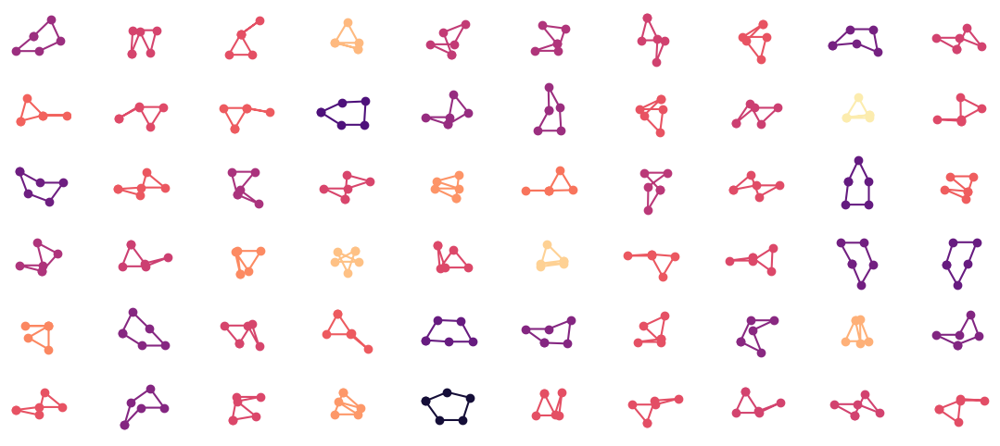

In [13]:
random.seed(1)
# Load data
data = np.loadtxt('1. data/pentagonsamplesSmall2.txt', delimiter=',')

print(data.shape[0])

# Energy computation
data_aug = np.zeros((data.shape[0], 10)) # augmented data
data_aug[:,2] = 1 
data_aug[:,[8,9,4,5,6,7]] = data
angle_data = np.zeros((data.shape[0],5)) # internal angles


for i in range(5):
    ii = (2*i -2)%10
    jj = (2*i - 1)%10
    u = data_aug[:, [ii, jj]]
    
    ii = (2*i)%10
    jj = (2*i + 1)%10
    v = data_aug[:, [ii , jj]]
    
    ii = (2*i + 2)%10
    jj = (2*i + 3)%10
    w = data_aug[:, [ii, jj]]
    
    z = np.sum((u - v)*(w-v), axis = 1)
    
    angle_data[:,i]  = np.arccos( np.minimum(z,1) )
    
energy = np.sum((angle_data - (3/5)*np.pi)**2 , axis = 1)

# plot sample pentagons
plt.figure(figsize=(14,6))
for i in range(60):
    ind = random.randint(0, data.shape[0])
    x = data_aug[ind].reshape(5,2).T
    cent = np.mean(x,axis=1)
    plt.subplot(6,10,i+1)
    plt.plot(x[0,range(-1,5)], x[1,range(-1,5)] , '-o', c= cm.magma(energy[ind]/np.max(energy)))
    plt.axis('square')
    plt.axis('off')
    plt.xlim(cent[0]-1.3,cent[0]+1.3);
    plt.ylim(cent[1]-1.3,cent[1]+1.3);

In [14]:
penta2 = np.loadtxt('1. data/M5_large.txt', delimiter=',')

print(penta2.shape)

(55679, 10)


In [31]:
type(data_aug)
print(penta2[123])
rearrange = [penta2[123][8], penta2[123][9], penta2[123][0], penta2[123][1], 
             penta2[123][2], penta2[123][3], penta2[123][4], penta2[123][5], penta2[123][6], penta2[123][7]]

print(rearrange)

i = [True, True, True, True, True, True, True, True, True, True]
j = [True, True, True, True, True, True, True, True, True, True]
print(np.any((i == [j[8], j[9], j[0], j[1], j[2], j[3], j[4], j[5], j[6], j[7]]) == [True, True, True, True, True, True, True, True, True, True])
)
print(np.all(i == [j[8], j[9], j[0], j[1], j[2], j[3], j[4], j[5], j[6], j[7]]))


[ 1.00000000e+00  0.00000000e+00  8.56638564e-05 -1.30889409e-02
 -9.69072165e-01 -2.59529812e-01 -2.60739982e-01 -9.65409064e-01
  0.00000000e+00  0.00000000e+00]
[0.0, 0.0, 1.0, 0.0, 8.566385643409696e-05, -0.013088940926299586, -0.9690721649484536, -0.25952981185925994, -0.26073998238136764, -0.9654090643803609]
False
True


In [32]:
counter = 0
for i in data_aug:
    print(counter)
    for j in penta2:
        if np.all(i == [j[8], j[9], j[0], j[1], j[2], j[3], j[4], j[5], j[6], j[7]]):
            print('Found one!')
            counter = counter + 1
print('counter is', counter)

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


KeyboardInterrupt: 

In [6]:
# #PCA
# pca = PCA(n_components=5)
# data_pca = pca.fit(data).transform(data)

# print('Explained Variance', pca.explained_variance_ratio_)

# fig = go.Figure(data=[go.Scatter3d(
#     x=data_pca[:,0], y=data_pca[:,1], z=data_pca[:,2], 
#     mode ='markers', 
#     marker=dict(size = 3, color =energy, colorscale='plasma' , opacity = 1)
# )])


# fig.update_layout(autosize=False, width=700, height=700)  

# fig.show()

In [5]:
# # ISOMAP
# # random subsample
# ind_rand_data = np.random.randint(0, high=data.shape[0], size= 4000)
# rand_data = data[ind_rand_data , :]

# iso = Isomap(n_components = 3 , n_neighbors = 7)
# rand_data_iso = iso.fit_transform(rand_data)

# fig = go.Figure(data=[go.Scatter3d(
#     x=rand_data_iso[:,0], y=rand_data_iso[:,1], z=rand_data_iso[:,2], 
#     mode ='markers', 
#     marker=dict(size = 3, color =energy[ind_rand_data], colorscale='plasma')
# )])

# fig.update_layout(autosize=False, width=700, height=700)

# fig.show()

In [4]:
# # LLE
# # random subsample
# ind_rand_data = np.random.randint(0, high=data.shape[0], size= 8000)
# rand_data = data[ind_rand_data , :]

# rand_data_lle = LLE(n_components = 3 , n_neighbors = 20).fit_transform(rand_data)

# fig = go.Figure(data=[go.Scatter3d(
#     x=rand_data_lle[:,0], y=rand_data_lle[:,1], z=rand_data_lle[:,2], 
#     mode ='markers', 
#     marker=dict(size = 3, color =energy[ind_rand_data], colorscale='plasma')
# )])

# fig.update_layout(autosize=False, width=700, height=700)

# fig.show()

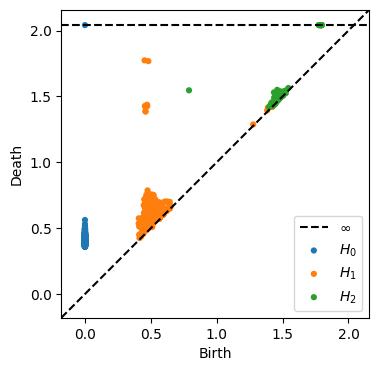

In [3]:
# Persistence Computation
n_land = 500
res = ripser(data, maxdim=2, n_perm = n_land, coeff =13, thresh = 1.8)
dgms = res['dgms']
plt.figure(figsize = (4,4)) 
plot_diagrams(dgms)

In [4]:
# pers1 = dgms[1][:,1] - dgms[1][:,0]
# pers2 = dgms[2][:,1] - dgms[2][:,0]

# pers1_sorted = np.sort(pers1)[::-1]
# pers2_sorted = np.sort(pers2[pers2 < np.Inf])[::-1]

# print('Persistence of top 10 1-d features:\n', np.around(pers1_sorted[0:10],decimals=2), '\n')
# print('Persistence of top 10 2-d features:\n', np.around(pers2_sorted[0:10],decimals=2))

In [4]:
n_lands = 1000

cc = CircularCoords(data , n_landmarks= n_lands)

In [5]:
coho_classes = [0, 1, 3, 4 ]

circular_coords = []

for i in coho_classes:
    circular_coords.append(cc.get_coordinates(perc = 0.6, cocycle_idx=i, standard_range= False))


In [6]:
thetas= CircleMapUtils.linear_combination(circular_coords, [[1,1,0,0], [0,1,0,0],[0,0,1,1]])

theta1 = CircleMapUtils.center(thetas[0])
theta2 = CircleMapUtils.center(thetas[1])
theta3 = CircleMapUtils.center(thetas[2])


# Plot the data using the computed circular coordintaes, and colors given by pentagon energy
fig = go.Figure(data=[go.Scatter3d(
    x=theta1, y=theta2, z=theta3, 
    mode ='markers', 
    marker=dict(size = 3, color =energy, colorscale='plasma')
)])

fig.update_layout(autosize=False, width=700, height=700)

fig.show()



In [19]:
new_data = np.array([theta1, theta2, theta3]).T
new_data.shape

(14074, 3)

In [8]:
from dreimac import GeometryExamples, PlotUtils, ComplexProjectiveCoords, ProjectiveMapUtils, GeometryUtils


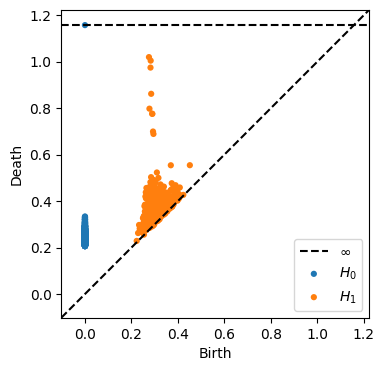

In [9]:
# Persistence Computation
n_land = 1000
n_neigh = 15

dist_mat, pc_perm = GeometryUtils.landmark_geodesic_distance(new_data, n_land, n_neigh)

res = ripser(dist_mat[:, 0:n_land], distance_matrix=True, maxdim=1, n_perm = n_land, coeff =13 , thresh = 1.2)
dgms = res['dgms']
plt.figure(figsize = (4,4)) 
plot_diagrams(dgms)

In [17]:
# pers1 = dgms[1][:,1] - dgms[1][:,0]
  
# pers1_sorted = np.sort(pers1)[::-1]
 
# print('Persistence of top 10 1-d features:\n', np.around(pers1_sorted[0:10],decimals=2), '\n')
 

In [10]:
cc_p = CircularCoords(dist_mat, distance_matrix=True , n_landmarks= n_land)

In [11]:
coho_classes_p = [0, 1, 3, 4, 5, 6, 7, 8]

circular_coords_p = []

for i in coho_classes:
    circular_coords_p.append(cc_p.get_coordinates(perc = 0.3, cocycle_idx=i, standard_range= False))
    


In [12]:
from dreimac import CircleMapUtils as CMU
from plotly.subplots import make_subplots

circular_coords_p[0] = CMU.center(circular_coords_p[0])
circular_coords_p[2] = CMU.center(circular_coords_p[2])
circular_coords_p[3] = CMU.center(circular_coords_p[3])

coordinates = circular_coords_p[0:4]
classes = coho_classes_p[0:4]

fig = make_subplots(rows=1, cols=len(coordinates), 
                    subplot_titles = tuple('Circ Coord '+str(i) for i in classes),
                    specs = [[{'type': 'scatter3d'} for i in classes]])

for i, coord in enumerate(coordinates):
    fig.add_trace(go.Scatter3d(
        x=theta1[pc_perm], y=theta2[pc_perm], z=theta3[pc_perm], mode ='markers', 
        marker=dict(size = 2 , 
                    color = coord , colorscale = 'plasma'
                    #CMU.to_sinebow(np.pi + CMU.center(coordinates[i]))
                   )),  
        row=1, col=i+1)
    fig.update_scenes(xaxis=dict( ticks='', showticklabels=False), 
                      yaxis=dict( ticks='', showticklabels=False), 
                      zaxis=dict( ticks='', showticklabels=False), 
                      aspectmode='data', row=1, col=i+1)


fig.update_layout( showlegend=False )
fig.show()

In [ ]:
fig = go.Figure(data=[go.Scatter3d(
    x=theta1[pc_perm], y=theta2[pc_perm], z=theta3[pc_perm], 
    mode ='markers', 
    marker=dict(size = 3, color =circular_coords_p[3], colorscale='plasma')
)])

fig.update_layout(autosize=False, width=700, height=700)

fig.show()

## Below, we will run the code to show the unfolded genus 4 

In [ ]:
#imports

import numpy as np
from sklearn import manifold
from dreimac import GeometryUtils, CircleMapUtils, CircularCoords
from ripser import ripser
from persim import plot_diagrams
import plotly.graph_objects as go
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.neighbors import NearestNeighbors
from scipy.sparse import csr_matrix
from plotly.subplots import make_subplots
from scipy.sparse.csgraph import shortest_path

#this function makes cuts and takes in a list of circular coords arrays as well as a neighbor graph and outputs a cut graph
def cut_neighbors(cuts, neighbor_graph):
    removals=0
    for ind, point in enumerate(neighbor_graph):
        counts=[]
        for count, i in enumerate(point[0]):
            if any(np.abs(cut[ind]-cut[i]) > 1.5*np.pi for cut in cuts): #Made an edit from 1 to 1.5 to fix infinity values
                counts.append(count)
                removals+=1
        neighbor_graph[ind][0]=np.delete(neighbor_graph[ind][0],counts)
        neighbor_graph[ind][1]=np.delete(neighbor_graph[ind][1],counts)
    print('Removals: ',removals)
    return neighbor_graph

In [21]:
#take in cuts as a list circular coordinate arrays

cuts=[circular_coords[0],circular_coords[1], circular_coords[2], circular_coords[3]]

#calculate the k nearest neighbors graph

n_land = 900
k_neigh = 20
nbrs = NearestNeighbors(n_neighbors=k_neigh, algorithm='ball_tree').fit(data)
distances, indices = nbrs.kneighbors(data)

#the output is a list of pairs of ndarrays that has length n_data. For any row (each representing a point),
#the first element of the pair is the indices in the data for the k nearest points
#and the second element is the distance between each point and the current row (point).
simplicial_complex=[[indices[i],distances[i]] for i in range(len(indices))]

new_neighbor_graph=cut_neighbors(cuts, simplicial_complex)

Removals:  8109


In [22]:
#now we transform our cut up graph into a numpy distance matrix and then a compressed sparse matrix
#we can do this because out neighbors graph contained distance data in it

n_data = data.shape[0]

kneighbors_graph=np.zeros((n_data,n_data))
for count, info in enumerate(simplicial_complex):
    for place, ind in enumerate(info[0]):
        kneighbors_graph[count,ind]=info[1][place]
kneighbors_graph=csr_matrix(kneighbors_graph)

#calculating geodesic distance matrix

n_landmarks=800

n_points = data.shape[0]
perm = np.zeros(n_landmarks, dtype=np.int64)
lambdas = np.zeros(n_landmarks)
ds = shortest_path(kneighbors_graph, indices=0, directed=False)
D = np.zeros((n_landmarks, n_points))
D[0, :] = ds
for i in range(1, n_landmarks):
    idx = np.argmax(ds)
    perm[i] = idx
    lambdas[i] = ds[idx]
    thisds = shortest_path(kneighbors_graph, indices=idx, directed=False)
    D[i, :] = thisds
    ds = np.minimum(ds, thisds)

perm_rest_points = np.setdiff1d(
np.arange(0, n_points, dtype=int), perm, assume_unique=True
)
perm_all_points = np.concatenate((perm, perm_rest_points))

dist_landmarks_points = D[:, perm_all_points]

#check that the distance matrix has no infinity values

inf_in_mat=[]
for i in dist_landmarks_points:
    inf_in_mat.append(list(np.isinf(i)).count(True)==0)

print('Distance matrix has no infinity values: ',all(inf_in_mat))

Distance matrix has no infinity values:  True


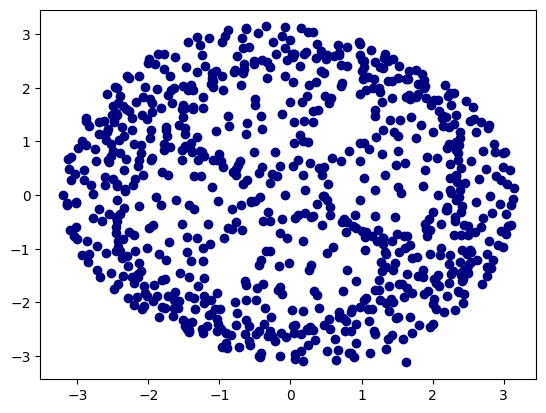

In [27]:
#using scipy to calculate the multi-dimensional scaling of the distance matrix

mds= manifold.MDS(
    n_components=2,
    metric=True,
    dissimilarity="precomputed",
    normalized_stress='auto'
)
unfolding = mds.fit_transform(dist_landmarks_points[:,0:dist_landmarks_points.shape[0]])

plt.scatter(unfolding[:, 0], unfolding[:, 1], color="navy")
plt.savefig('genus4-planar.png')

In [24]:
# coordinates = circular_coords[4:]
# classes = coho_classes[4:]

# fig = make_subplots(rows=1, cols=len(coordinates), 
#                     subplot_titles = tuple('Circ Coord '+str(i) for i in classes),
#                     specs = [[{'type': 'scatter3d'} for i in classes]])

# for i, coord in enumerate(coordinates):
#     fig.add_trace(go.Scatter3d(
#         x=theta1[pc_perm], y=theta2[pc_perm], z=theta3[pc_perm], mode ='markers', 
#         marker=dict(size = 2 , 
#                     color = coord , colorscale = 'plasma'
#                     #CMU.to_sinebow(np.pi + CMU.center(coordinates[i]))
#                    )),  
#         row=1, col=i+1)
#     fig.update_scenes(xaxis=dict( ticks='', showticklabels=False), 
#                       yaxis=dict( ticks='', showticklabels=False), 
#                       zaxis=dict( ticks='', showticklabels=False), 
#                       aspectmode='data', row=1, col=i+1)


# fig.update_layout( showlegend=False )
# fig.show()

---

<img src="https://i.ibb.co/86WnYMT/Eq-Penta-Surf.png" alt="test-1" border="0" width=700px>

In [25]:
# #plot with hovering affects
# #test with 64 enconding

# fig = go.Figure(data=[
#     go.Scatter3d(x=theta1, y=theta2, z=theta3, 
#         mode='markers', marker=dict(size = 2, color =energy, colorscale='plasma')
#     )
# ])

# # turn off native plotly.js hover effects - make sure to use
# # hoverinfo="none" rather than "skip" which also halts events.
# fig.update_traces(hoverinfo="none", hovertemplate=None)
# fig.update_layout(
#     scene = dict(
#         xaxis = dict(range=[-1,8],),
#         yaxis = dict(range=[-1,8],),
#         zaxis = dict(range=[-1,8],),
#     ), width=700, height=700
# )

# app = JupyterDash(__name__)

# server = app.server

# app.layout = html.Div([
#     dcc.Graph(id="graph-basic-2", figure=fig, clear_on_unhover=True),
#     dcc.Tooltip(id="graph-tooltip"),
# ])


# @app.callback(
#     Output("graph-tooltip", "show"),
#     Output("graph-tooltip", "bbox"),
#     Output("graph-tooltip", "children"),
#     Input("graph-basic-2", "hoverData"),
# )

# def display_hover(hoverData):
#     if hoverData is None:
#         return False, no_update, no_update

#     # demo only shows the first point, but other points may also be available
#     pt = hoverData["points"][0]
#     bbox = pt["bbox"]
#     num = pt["pointNumber"]

#     img_fname = 'images/'+str(num+1)+'.png'
#     encoded_img = base64.b64encode(open(img_fname, 'rb').read())

#     children = [
#         html.Div([
#             html.Img(src='data:image/png;base64,{}'.format(encoded_img.decode()), style={'width': '100%'}),
#         ], style={'width': '80px', 'white-space': 'normal'})
#     ]

#     return True, bbox, children

# app.run_server(mode="inline")


----